In [1]:
import os 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
from datetime import datetime, timedelta
from utils import getThicknesses,calculate_weighted_averages,get_weights_for_soildepths,calculate_psychrometric_constant,calculate_slope_saturation_vapor_pressure_curve,calculate_Makkink_ET
from windrose import WindroseAxes
import xarray as xr

In [2]:
data_location = "/home/khanalp/code/PhD/fielddataprocessing/data"

In [3]:
# Open the JSON file and load it into a dictionary
with open(os.path.join(data_location, "location_dict.json"), 'r') as f:
    dict_location = json.load(f)

In [4]:
logger_id_voedselbos = dict_location['ketelbroek']['K1_ATMOS_SMST']['logger_id']
logger_id_grasveld = dict_location['ketelbroek']['K2_ATMOS_SMST']['logger_id']
logger_id_voedselbos

'z6-21180'

In [5]:
csv_voedselbos = [os.path.join(data_location,file) for file in os.listdir(data_location) if logger_id_voedselbos in file]
csv_grasveld = [os.path.join(data_location,file) for file in os.listdir(data_location) if logger_id_grasveld in file]

In [6]:
df_voedselbos = pd.read_csv(csv_voedselbos[0])
df_grasveld = pd.read_csv(csv_grasveld[0])
df_voedselbos.columns

Index(['Timestamps', ' W/m² Solar Radiation', ' mm Precipitation',
       ' Lightning Activity', ' km Lightning Distance', '° Wind Direction',
       ' m/s Wind Speed', ' m/s Gust Speed', ' °C Air Temperature',
       ' kPa Vapor Pressure', ' kPa Atmospheric Pressure', '° X-axis Level',
       '° Y-axis Level', ' mm/h Max Precip Rate', ' °C RH Sensor Temp',
       ' kPa VPD', 'soil_moisture_5cm', 'soil_temperature_5cm',
       'soil_moisture_10cm', 'soil_temperature_10cm', 'soil_moisture_20cm',
       'soil_temperature_20cm', 'soil_moisture_40cm', 'soil_temperature_40cm',
       'soil_moisture_80cm', 'soil_temperature_80cm', '% Battery Percent',
       ' mV Battery Voltage', ' kPa Reference Pressure',
       ' °C Logger Temperature'],
      dtype='object')

In [7]:
# Convert 'time' column to datetime format
df_voedselbos['Timestamps'] = pd.to_datetime(df_voedselbos['Timestamps'])
df_grasveld['Timestamps'] = pd.to_datetime(df_grasveld['Timestamps'])


In [8]:
# Set 'time' column as index
df_voedselbos.set_index('Timestamps', inplace=True)
df_grasveld.set_index('Timestamps', inplace=True)

In [9]:
soil_depths_voedselbos = dict_location['ketelbroek']['K1_ATMOS_SMST']['depths']
soil_depths_grasveld = dict_location['ketelbroek']['K2_ATMOS_SMST']['depths']

In [10]:
# Since both depths are similar, I get weight only once
soil_thickness_weight = get_weights_for_soildepths(soil_depths_voedselbos)

In [11]:
df_voedselbos.columns

Index([' W/m² Solar Radiation', ' mm Precipitation', ' Lightning Activity',
       ' km Lightning Distance', '° Wind Direction', ' m/s Wind Speed',
       ' m/s Gust Speed', ' °C Air Temperature', ' kPa Vapor Pressure',
       ' kPa Atmospheric Pressure', '° X-axis Level', '° Y-axis Level',
       ' mm/h Max Precip Rate', ' °C RH Sensor Temp', ' kPa VPD',
       'soil_moisture_5cm', 'soil_temperature_5cm', 'soil_moisture_10cm',
       'soil_temperature_10cm', 'soil_moisture_20cm', 'soil_temperature_20cm',
       'soil_moisture_40cm', 'soil_temperature_40cm', 'soil_moisture_80cm',
       'soil_temperature_80cm', '% Battery Percent', ' mV Battery Voltage',
       ' kPa Reference Pressure', ' °C Logger Temperature'],
      dtype='object')

In [12]:
df_voedselbos['RZSM'] = calculate_weighted_averages(data_array=np.array(df_voedselbos.filter(regex=r'soil_moisture_')),
                                                    weights=np.array(soil_thickness_weight))
df_voedselbos['RZST'] = calculate_weighted_averages(data_array=np.array(df_voedselbos.filter(regex=r'soil_temperature')),
                                                    weights=np.array(soil_thickness_weight))
df_grasveld['RZSM'] = calculate_weighted_averages(data_array=np.array(df_grasveld.filter(regex=r'soil_moisture_')),
                                                    weights=np.array(soil_thickness_weight))
df_grasveld['RZST'] = calculate_weighted_averages(data_array=np.array(df_grasveld.filter(regex=r'soil_temperature')),
                                                    weights=np.array(soil_thickness_weight))

In [13]:
starting_day = min(((df_grasveld.index[0] + pd.DateOffset(months=1)).replace(day=1)).normalize(), 
                   ((df_voedselbos.index[0] + pd.DateOffset(months=1)).replace(day=1)).normalize())

In [14]:

df_voedselbos = df_voedselbos[df_voedselbos.index >= starting_day]
df_grasveld = df_grasveld[df_grasveld.index >= starting_day]

In [15]:
df_voedselbos.columns

Index([' W/m² Solar Radiation', ' mm Precipitation', ' Lightning Activity',
       ' km Lightning Distance', '° Wind Direction', ' m/s Wind Speed',
       ' m/s Gust Speed', ' °C Air Temperature', ' kPa Vapor Pressure',
       ' kPa Atmospheric Pressure', '° X-axis Level', '° Y-axis Level',
       ' mm/h Max Precip Rate', ' °C RH Sensor Temp', ' kPa VPD',
       'soil_moisture_5cm', 'soil_temperature_5cm', 'soil_moisture_10cm',
       'soil_temperature_10cm', 'soil_moisture_20cm', 'soil_temperature_20cm',
       'soil_moisture_40cm', 'soil_temperature_40cm', 'soil_moisture_80cm',
       'soil_temperature_80cm', '% Battery Percent', ' mV Battery Voltage',
       ' kPa Reference Pressure', ' °C Logger Temperature', 'RZSM', 'RZST'],
      dtype='object')

In [16]:
# Define the exact columns and partial column names to select
exact_columns = [' W/m² Solar Radiation', ' mm Precipitation', ' °C Air Temperature',' kPa Atmospheric Pressure', ' kPa VPD', 'RZSM', 'RZST']
partial_columns = ['soil_moisture_', 'soil_temperature_']

In [17]:
# Select the desired columns from the DataFrame
df_voedselbos_selected = df_voedselbos[exact_columns + [col for partial_col in partial_columns for col in df_voedselbos.filter(like=partial_col).columns]]
df_grasveld_selected = df_grasveld[exact_columns + [col for partial_col in partial_columns for col in df_grasveld.filter(like=partial_col).columns]]

In [18]:
# Define the aggregation functions
agg_dict= {col: 'mean' for col in df_voedselbos_selected.columns}
agg_dict[' mm Precipitation'] = 'sum'

In [19]:
# Resample the DataFrame
df_voedselbos_selected_resampled = df_voedselbos_selected.resample('30T', label='right' ).agg(agg_dict)
df_grasveld_selected_resampled = df_grasveld_selected.resample('30T', label='right').agg(agg_dict)

In [20]:
colors = ['blue' , 'green', 'red', 'purple','brown']

In [21]:
# Assuming df_resampled_voedselbos is your dataframe and 'precipitation_mm' is the column of interest
df_voedselbos_selected_resampled[' mm Cummulative Precipitation'] = df_voedselbos_selected_resampled[' mm Precipitation'].cumsum()
df_grasveld_selected_resampled[' mm Cummulative Precipitation'] = df_grasveld_selected_resampled[' mm Precipitation'].cumsum()

In [22]:
df_voedselbos_selected_resampled.columns

Index([' W/m² Solar Radiation', ' mm Precipitation', ' °C Air Temperature',
       ' kPa Atmospheric Pressure', ' kPa VPD', 'RZSM', 'RZST',
       'soil_moisture_5cm', 'soil_moisture_10cm', 'soil_moisture_20cm',
       'soil_moisture_40cm', 'soil_moisture_80cm', 'soil_temperature_5cm',
       'soil_temperature_10cm', 'soil_temperature_20cm',
       'soil_temperature_40cm', 'soil_temperature_80cm',
       ' mm Cummulative Precipitation'],
      dtype='object')

In [23]:
df_voedselbos_selected_resampled['ET0_Makkink'] = calculate_Makkink_ET(T = df_voedselbos_selected_resampled[' °C Air Temperature'].values,
                                                                       pressure_kpa = df_voedselbos_selected_resampled[' kPa Atmospheric Pressure'].values,
                                                                       radiation=df_voedselbos_selected_resampled[' W/m² Solar Radiation'].values)

In [24]:
df_grasveld_selected_resampled['ET0_Makkink'] = calculate_Makkink_ET(T = df_grasveld_selected_resampled[' °C Air Temperature'].values,
                                                                       pressure_kpa = df_grasveld_selected_resampled[' kPa Atmospheric Pressure'].values,
                                                                       radiation=df_grasveld_selected_resampled[' W/m² Solar Radiation'].values)

In [25]:
df_voedselbos_selected_resampled['diff_P_ET0'] = df_voedselbos_selected_resampled[' mm Precipitation'] - df_voedselbos_selected_resampled['ET0_Makkink'] 
df_grasveld_selected_resampled['diff_P_ET0'] = df_grasveld_selected_resampled[' mm Precipitation'] - df_grasveld_selected_resampled['ET0_Makkink'] 

In [26]:
# Assuming df_resampled_voedselbos is your dataframe and 'precipitation_mm' is the column of interest
df_voedselbos_selected_resampled[' mm Cummulative diff_P_ET0'] = df_voedselbos_selected_resampled['diff_P_ET0'].cumsum()
df_grasveld_selected_resampled[' mm Cummulative diff_P_ET0'] = df_grasveld_selected_resampled['diff_P_ET0'].cumsum()

In [30]:
df_voedselbos_selected_resampled[' mm Cummulative ET0'] = df_voedselbos_selected_resampled['ET0_Makkink'] .cumsum()
df_grasveld_selected_resampled[' mm Cummulative ET0'] = df_grasveld_selected_resampled['ET0_Makkink'] .cumsum()

In [28]:
def plot_line(column_name,ylabel,title):# Plot precipitation comparison between two sites
    plt.rcParams.update({'font.size': 34})

    fig, ax = plt.subplots(figsize=(45, 15))

    # Plot Voedselbos precipitation
    ax.plot(df_voedselbos_selected_resampled.index, df_voedselbos_selected_resampled[column_name], label='Voedselbos', 
            color='blue', linewidth=3)
    # Plot Grassland precipitation
    ax.plot(df_grasveld_selected_resampled.index, df_grasveld_selected_resampled[column_name], label='Grassland', 
            color='red', linewidth=3)
    ax.set_xlabel('Time')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    ax.grid(True)

    plt.show()

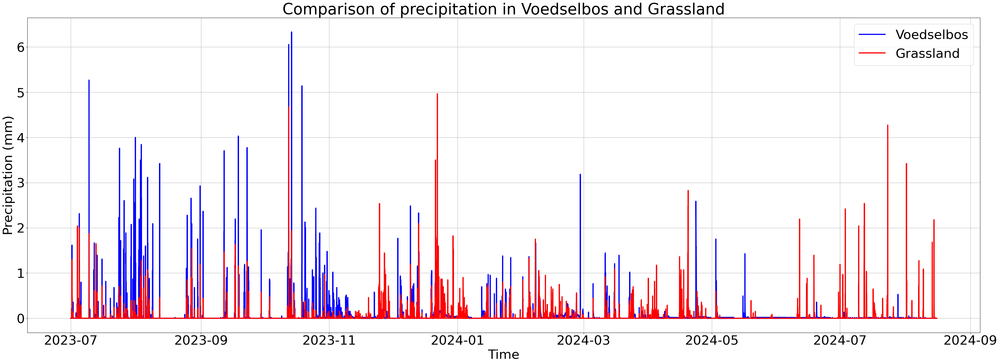

In [46]:
plot_line(' mm Precipitation',"Precipitation (mm)","Comparison of precipitation in Voedselbos and Grassland")

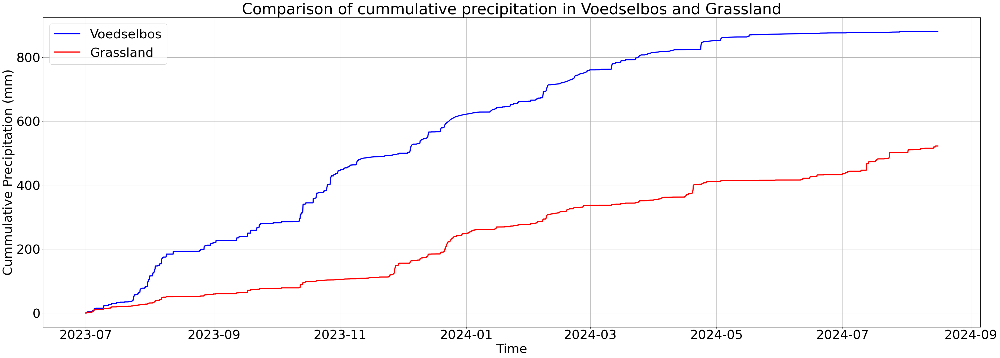

In [31]:
plot_line(' mm Cummulative Precipitation','Cummulative Precipitation (mm)',"Comparison of cummulative precipitation in Voedselbos and Grassland")

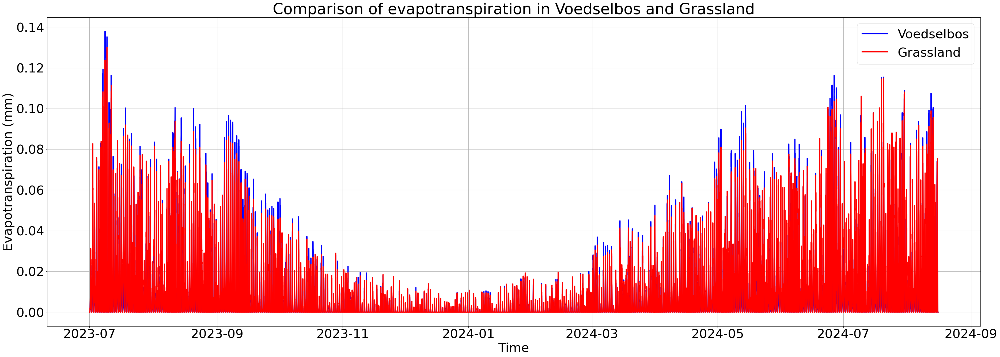

In [33]:
plot_line('ET0_Makkink','Evapotranspiration (mm)',"Comparison of evapotranspiration in Voedselbos and Grassland")

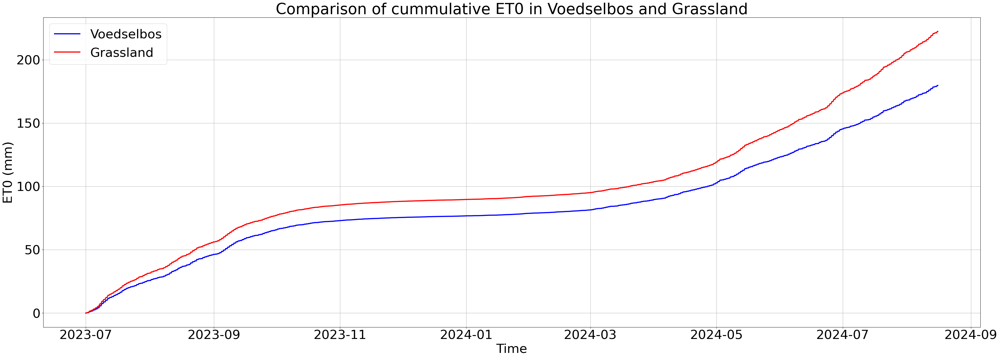

In [32]:
plot_line(' mm Cummulative ET0','ET0 (mm)',"Comparison of cummulative ET0 in Voedselbos and Grassland")

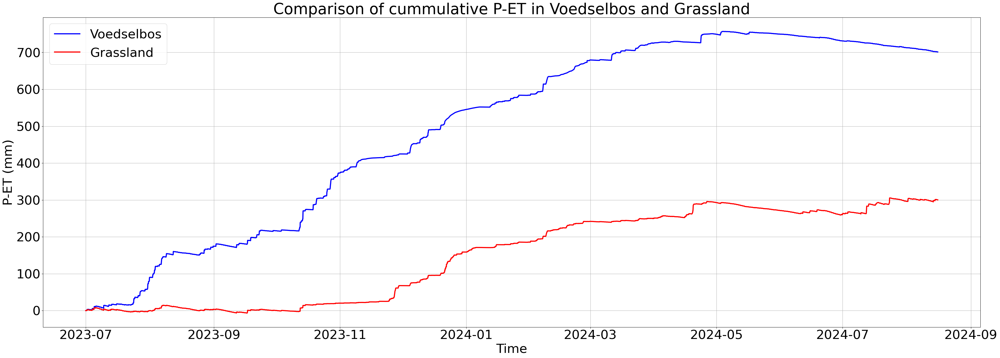

In [49]:
plot_line(' mm Cummulative diff_P_ET0','P-ET (mm)',"Comparison of cummulative P-ET in Voedselbos and Grassland")

In [28]:
df_voedselbos_selected_resampled.columns


Index([' W/m² Solar Radiation', ' mm Precipitation', ' °C Air Temperature',
       ' kPa Atmospheric Pressure', ' kPa VPD', 'RZSM', 'RZST',
       'soil_moisture_5cm', 'soil_moisture_10cm', 'soil_moisture_20cm',
       'soil_moisture_40cm', 'soil_moisture_80cm', 'soil_temperature_5cm',
       'soil_temperature_10cm', 'soil_temperature_20cm',
       'soil_temperature_40cm', 'soil_temperature_80cm',
       ' mm Cummulative Precipitation', 'ET0_Makkink', 'diff_P_ET0',
       ' mm Cummulative diff_P_ET0'],
      dtype='object')

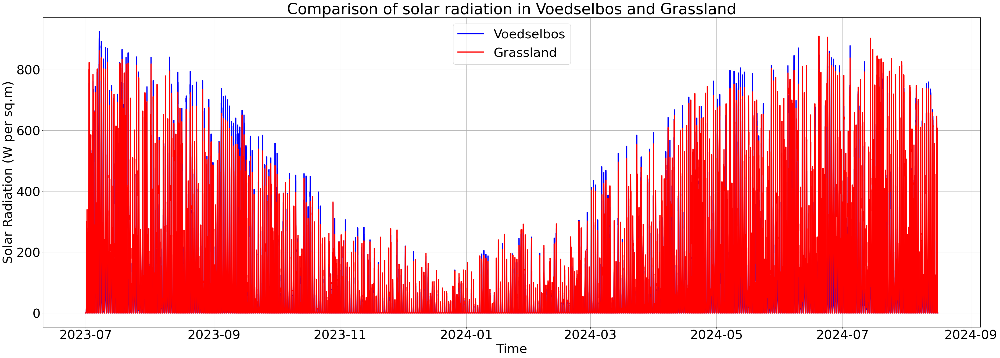

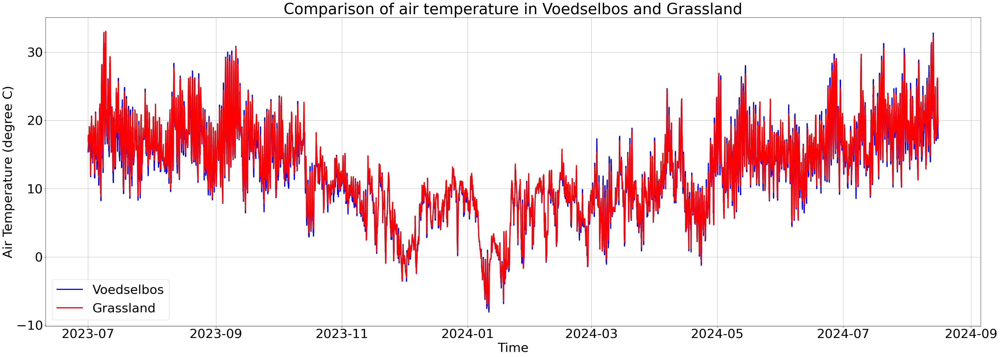

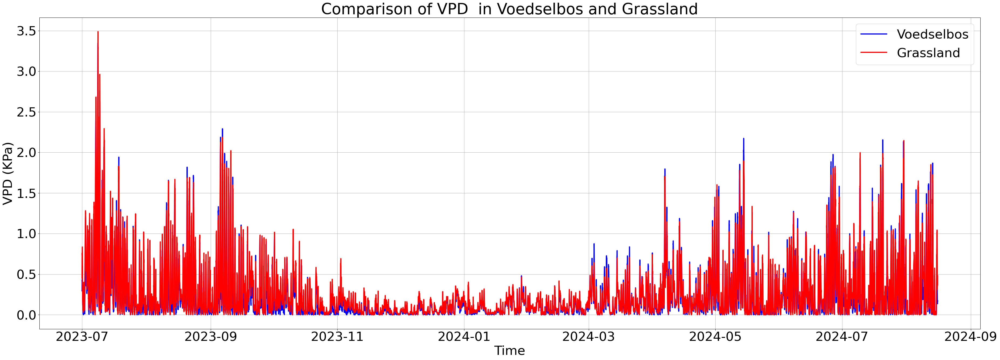

In [31]:
plot_line(' W/m² Solar Radiation','Solar Radiation (W per sq.m)',"Comparison of solar radiation in Voedselbos and Grassland")
plot_line(' °C Air Temperature','Air Temperature (degree C)',"Comparison of air temperature in Voedselbos and Grassland")
plot_line(' kPa VPD','VPD (KPa)',"Comparison of VPD  in Voedselbos and Grassland")

We can see some local effects of the field in the measurement of the precipitation.

In [52]:
depths = soil_depths_grasveld

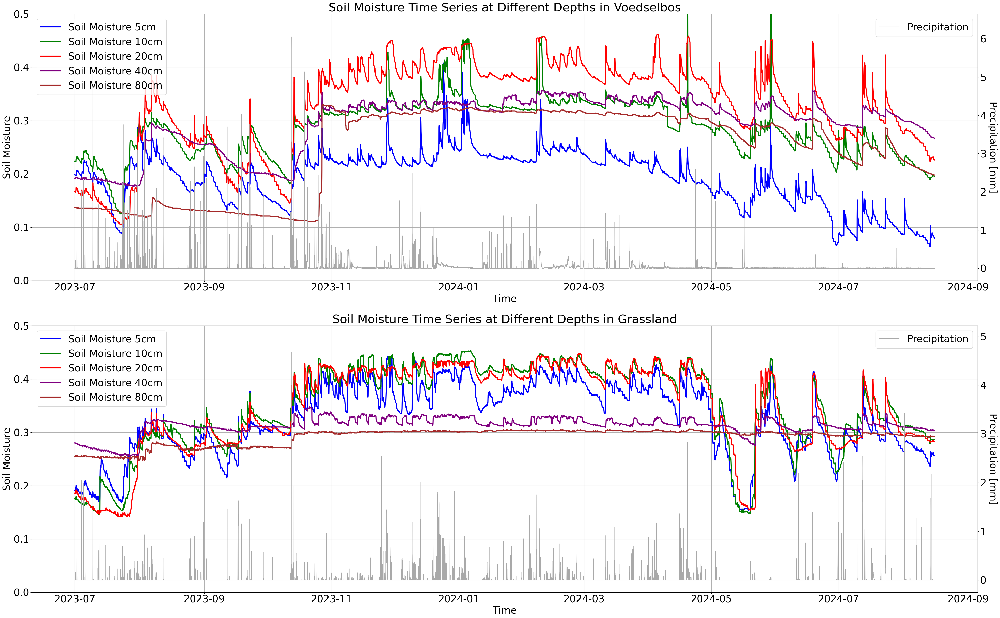

In [55]:
# Plot precipitation comparison between two sites
plt.rcParams.update({'font.size': 28})

fig, (ax1, ax3) = plt.subplots(nrows=2, figsize=(40, 25))

# Plot Voedselbos precipitation
for depth, color in zip(depths, colors):
    ax1.plot(df_voedselbos_selected_resampled.index,df_voedselbos_selected_resampled[f'soil_moisture_{depth}cm'], label=f'Soil Moisture {depth}cm', 
            color=color,
            linewidth=3)

ax1.set_xlabel('Time')
ax1.set_ylabel('Soil Moisture')
ax1.set_title('Soil Moisture Time Series at Different Depths in Voedselbos')
ax1.legend(loc='upper left')
ax1.set_ylim(0,0.5)
ax1.grid(True)
ax2 = ax1.twinx()
ax2.plot(df_voedselbos_selected_resampled.index,df_voedselbos_selected_resampled[' mm Precipitation'], label='Precipitation', color='darkgrey') #label=precipitation['parameter']
ax2.legend(loc='upper right')
ax2.set_ylabel('Precipitation [mm]', rotation=270, verticalalignment='bottom')



# Plot Voedselbos precipitation
for depth, color in zip(depths, colors):
    ax3.plot(df_grasveld_selected_resampled.index,df_grasveld_selected_resampled[f'soil_moisture_{depth}cm'], label=f'Soil Moisture {depth}cm', 
            color=color,
            linewidth=3)

ax3.set_xlabel('Time')
ax3.set_ylabel('Soil Moisture')
ax3.set_title('Soil Moisture Time Series at Different Depths in Grassland')
ax3.legend(loc ='upper left')
ax3.set_ylim(0,0.5)
ax3.grid(True)
ax4 = ax3.twinx()
ax4.plot(df_grasveld_selected_resampled.index,df_grasveld_selected_resampled[' mm Precipitation'], label='Precipitation', color='darkgrey') #label=precipitation['parameter']
ax4.legend(loc='upper right')
ax4.set_ylabel('Precipitation [mm]', rotation=270, verticalalignment='bottom')



plt.tight_layout()
plt.show()

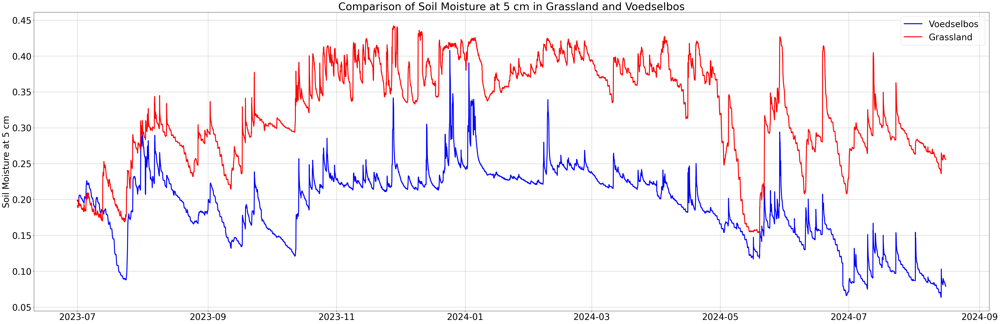

<Figure size 640x480 with 0 Axes>

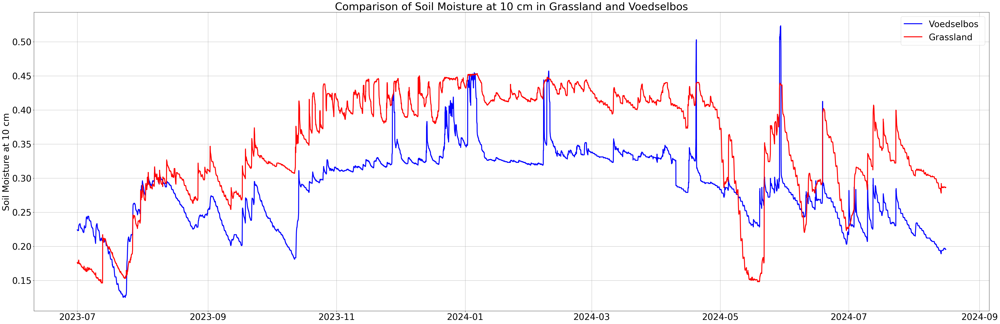

<Figure size 640x480 with 0 Axes>

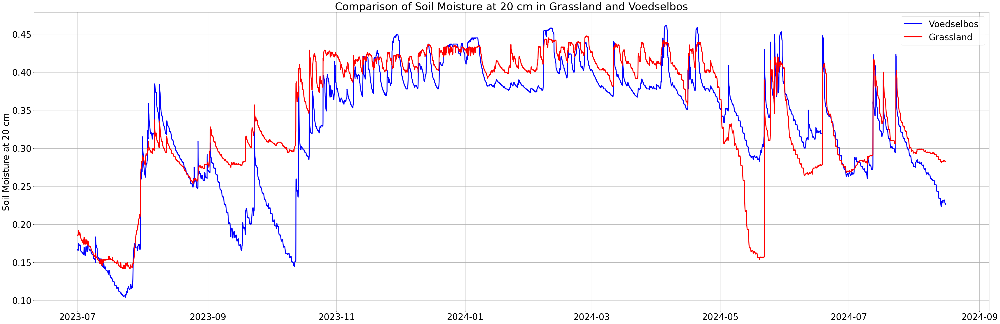

<Figure size 640x480 with 0 Axes>

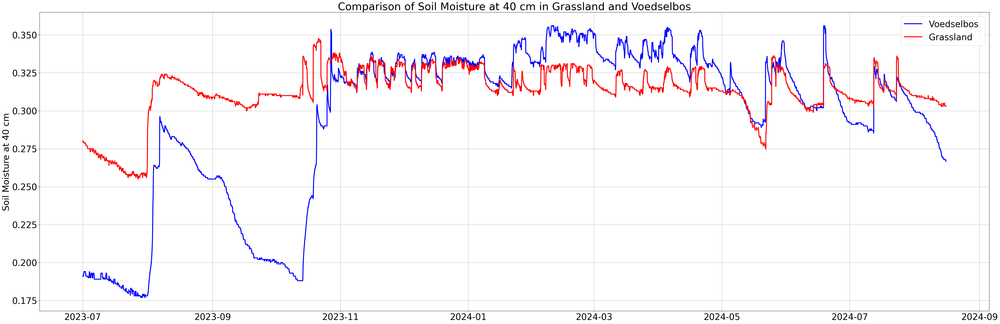

<Figure size 640x480 with 0 Axes>

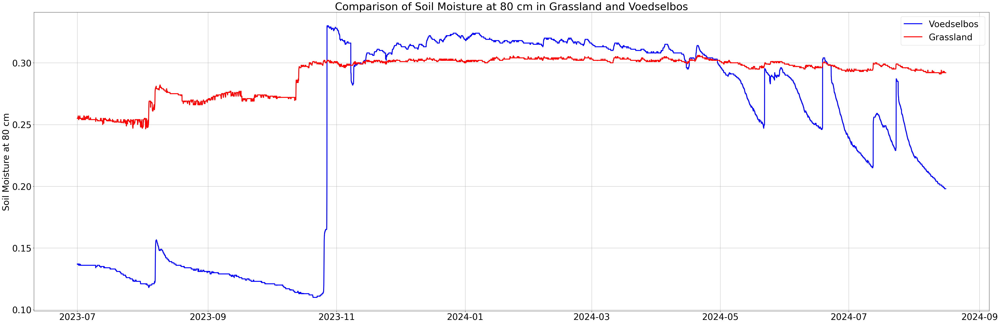

<Figure size 640x480 with 0 Axes>

In [57]:
# Loop through each soil moisture depth and plot separately
for depth in depths:
    fig, ax = plt.subplots(figsize=(45, 15))
    
    # Plot for Voedselbos
    ax.plot(df_voedselbos_selected_resampled.index, 
            df_voedselbos_selected_resampled[f'soil_moisture_{depth}cm'], 
            label=f'Voedselbos ', 
            color='blue', 
            linewidth=3)
    
    # Plot for Grassland
    ax.plot(df_grasveld_selected_resampled.index, 
            df_grasveld_selected_resampled[f'soil_moisture_{depth}cm'], 
            label=f'Grassland', 
            color='red', 
            linewidth=3)
    
    ax.set_ylabel(f'Soil Moisture at {depth} cm')
    ax.set_title(f'Comparison of Soil Moisture at {depth} cm in Grassland and Voedselbos')
    
    ax.legend(loc='upper right')
    ax.grid(True)
    plt.tight_layout()
    
    # Save the plot (uncomment to enable saving)
    # outputfile_path = os.path.join(output_plot_path, "maycomparison", f'comparison_soil_moisture_{depth}cm.png')
    # plt.savefig(outputfile_path, dpi=300)
    
    plt.show()
    plt.clf()

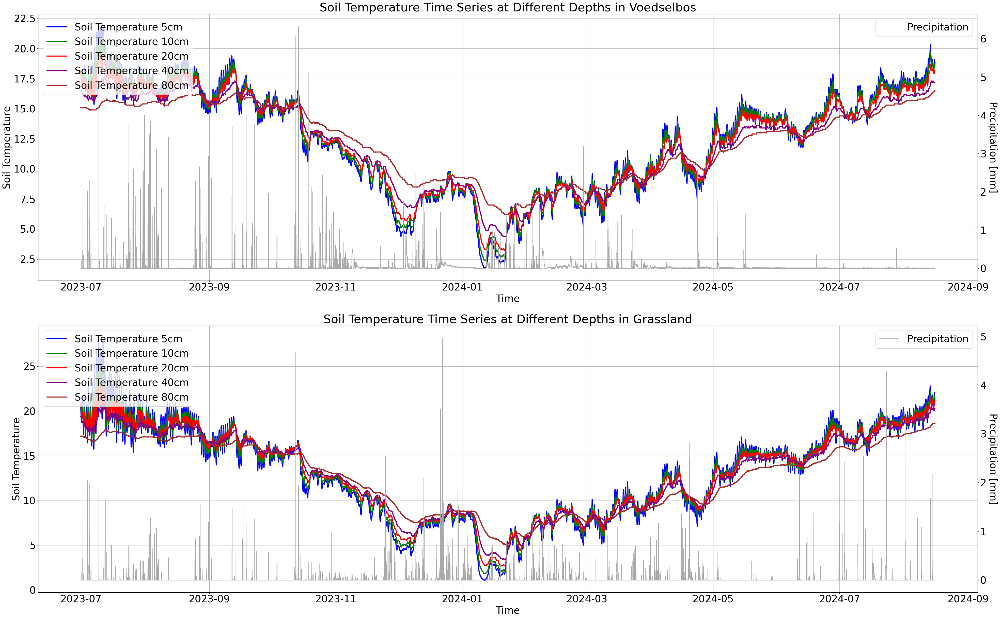

In [67]:
# Plot precipitation comparison between two sites
plt.rcParams.update({'font.size': 28})

fig, (ax1, ax3) = plt.subplots(nrows=2, figsize=(40, 25))

# Plot Voedselbos precipitation
for depth, color in zip(depths, colors):
    ax1.plot(df_voedselbos_selected_resampled.index,df_voedselbos_selected_resampled[f'soil_temperature_{depth}cm'], label=f'Soil Temperature {depth}cm', 
            color=color,
            linewidth=3)

ax1.set_xlabel('Time')
ax1.set_ylabel('Soil Temperature')
ax1.set_title('Soil Temperature Time Series at Different Depths in Voedselbos')
ax1.legend(loc='upper left')
ax1.grid(True)
ax2 = ax1.twinx()
ax2.plot(df_voedselbos_selected_resampled.index,df_voedselbos_selected_resampled[' mm Precipitation'], label='Precipitation', color='darkgrey') #label=precipitation['parameter']
ax2.legend(loc='upper right')
ax2.set_ylabel('Precipitation [mm]', rotation=270, verticalalignment='bottom')



# Plot Voedselbos precipitation
for depth, color in zip(depths, colors):
    ax3.plot(df_grasveld_selected_resampled.index,df_grasveld_selected_resampled[f'soil_temperature_{depth}cm'], label=f'Soil Temperature {depth}cm', 
            color=color,
            linewidth=3)

ax3.set_xlabel('Time')
ax3.set_ylabel('Soil Temperature')
ax3.set_title('Soil Temperature Time Series at Different Depths in Grassland')
ax3.legend(loc ='upper left')
ax3.grid(True)
ax4 = ax3.twinx()
ax4.plot(df_grasveld_selected_resampled.index,df_grasveld_selected_resampled[' mm Precipitation'], label='Precipitation', color='darkgrey') #label=precipitation['parameter']
ax4.legend(loc='upper right')
ax4.set_ylabel('Precipitation [mm]', rotation=270, verticalalignment='bottom')



plt.tight_layout()
plt.show()

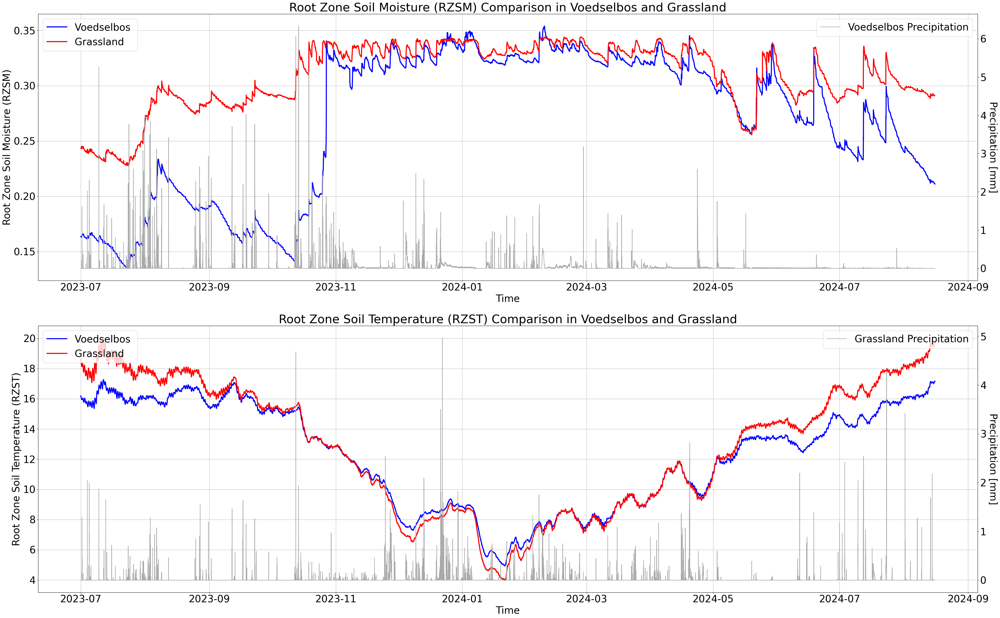

In [70]:
plt.rcParams.update({'font.size': 28})

# Create a figure with two subplots for RZSM and RZST
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(40, 25))

# Plot for Voedselbos - RZSM
ax1.plot(df_voedselbos_selected_resampled.index, 
         df_voedselbos_selected_resampled['RZSM'], 
         label='Voedselbos ', 
         color='blue', 
         linewidth=3)

# Plot for Grassland - RZSM
ax1.plot(df_grasveld_selected_resampled.index, 
         df_grasveld_selected_resampled['RZSM'], 
         label='Grassland ', 
         color='red', 
         linewidth=3)

# Precipitation for Voedselbos on ax1
ax1.set_xlabel('Time')
ax1.set_ylabel('Root Zone Soil Moisture (RZSM)')
ax1.set_title('Root Zone Soil Moisture (RZSM) Comparison in Voedselbos and Grassland')
ax1.legend(loc='upper left')
ax1.grid(True)

ax1_twin = ax1.twinx()
ax1_twin.plot(df_voedselbos_selected_resampled.index, 
              df_voedselbos_selected_resampled[' mm Precipitation'], 
              label='Voedselbos Precipitation', 
              color='darkgrey')
ax1_twin.legend(loc='upper right')
ax1_twin.set_ylabel('Precipitation [mm]', rotation=270, verticalalignment='bottom')

# Plot for Voedselbos - RZST
ax2.plot(df_voedselbos_selected_resampled.index, 
         df_voedselbos_selected_resampled['RZST'], 
         label='Voedselbos ', 
         color='blue', 
         linewidth=3)

# Plot for Grassland - RZST
ax2.plot(df_grasveld_selected_resampled.index, 
         df_grasveld_selected_resampled['RZST'], 
         label='Grassland ', 
         color='red', 
         linewidth=3)

# Precipitation for Grassland on ax2
ax2.set_xlabel('Time')
ax2.set_ylabel('Root Zone Soil Temperature (RZST)')
ax2.set_title('Root Zone Soil Temperature (RZST) Comparison in Voedselbos and Grassland')
ax2.legend(loc='upper left')
ax2.grid(True)

ax2_twin = ax2.twinx()
ax2_twin.plot(df_grasveld_selected_resampled.index, 
              df_grasveld_selected_resampled[' mm Precipitation'], 
              label='Grassland Precipitation', 
              color='darkgrey')
ax2_twin.legend(loc='upper right')
ax2_twin.set_ylabel('Precipitation [mm]', rotation=270, verticalalignment='bottom')

plt.tight_layout()
plt.show()


## For Making Windrose

In [80]:
plt.rcParams.update({'font.size': 14})

In [81]:
def plot_windrose(data_frame,output_path):
    dframe_wind = data_frame[['° Wind Direction',' m/s Wind Speed']]
    dframe_wind.columns = ['degrees_Wind_Direction','m/s_Wind_Speed']
    df_filtered = dframe_wind.dropna()
    df_filtered['time'] = df_filtered.index
    # Convert 'Timestamps' column to pandas DateTime format
    df_filtered['time'] = pd.to_datetime(df_filtered['time'])
    ax = WindroseAxes.from_ax()
    ax.bar(df_filtered['degrees_Wind_Direction'].values, df_filtered['m/s_Wind_Speed'].values, normed=True, opening=0.8, edgecolor='white',
        bins=np.arange(0, 8, 2))
    ax.set_title(f"Windrose including all data")  # Use month name from the dictionary
    
    # Add a note indicating wind speeds are in m/s
    ax.text(0.5, -0.1, 'Wind speeds are in m/s', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=10)

    # Move the legend down by adjusting the bbox_to_anchor parameter
    ax.legend(bbox_to_anchor=(-0.1, -0.1), loc='lower left')

    # Save the plot as an image file
    output_file = os.path.join(output_path, "alldata.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight')  # Adjust dpi for better quality and bbox_inches for tight layout
    # plt.show()  # Close the plot to free up memory
    

In [82]:
# Read CSV file into DataFrame
def plot_monthly_windrose(data_frame,output_path):
    dframe_wind = data_frame[['° Wind Direction',' m/s Wind Speed']]
    dframe_wind.columns = ['degrees_Wind_Direction','m/s_Wind_Speed']
    df_filtered = dframe_wind.dropna()
    df_filtered['time'] = df_filtered.index
    # Convert 'Timestamps' column to pandas DateTime format
    df_filtered['time'] = pd.to_datetime(df_filtered['time'])

    # Define a dictionary to map month numbers to their names
    month_names = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
                7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
    
        # Generate windrose plots for individual months
    for i in range(1, 13):  # Loop over two months (for demonstration)
        # Filter DataFrame for a particular month
        selected_month = df_filtered[df_filtered['time'].dt.month == i]  
        ax = WindroseAxes.from_ax()
        ax.bar(selected_month['degrees_Wind_Direction'].values, selected_month['m/s_Wind_Speed'].values, normed=True, opening=0.8, edgecolor='white',
            bins=np.arange(0, 8, 2))
        ax.set_title(f"Windrose for {month_names[i]}")  # Use month name from the dictionary
        
        # Add a note indicating wind speeds are in m/s
        ax.text(0.5, -0.1, 'Wind speeds are in m/s', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=10)
    
        # Move the legend down by adjusting the bbox_to_anchor parameter
        ax.legend(bbox_to_anchor=(-0.1, -0.1), loc='lower left')
    
        # Save the plot as an image file
        output_file = os.path.join(output_path, f"{month_names[i]}.png")
        plt.savefig(output_file, dpi=300, bbox_inches='tight')  # Adjust dpi for better quality and bbox_inches for tight layout
        # plt.show()  # Close the plot to free up memory


In [83]:
# Read CSV file into DataFrame
def plot_seasonal_windrose(data_frame,output_path):
    dframe_wind = data_frame[['° Wind Direction',' m/s Wind Speed']]
    dframe_wind.columns = ['degrees_Wind_Direction','m/s_Wind_Speed']
    df_filtered = dframe_wind.dropna()
    df_filtered['time'] = df_filtered.index
    # Convert 'Timestamps' column to pandas DateTime format
    df_filtered['time'] = pd.to_datetime(df_filtered['time'])

    # Define a dictionary to map month numbers to their names
    month_names = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
                7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}

    # Define a dictionary to map season names to their corresponding months
    seasons = {'DJF': [12, 1, 2], 'MAM': [3, 4, 5], 'JJA': [6, 7, 8], 'SON': [9, 10, 11]}

    # Generate windrose plots for seasons
    for season, months in seasons.items():
        # Filter DataFrame for the current season
        selected_season = df_filtered[df_filtered['time'].dt.month.isin(months)]  
        ax = WindroseAxes.from_ax()
        ax.bar(selected_season['degrees_Wind_Direction'].values, selected_season['m/s_Wind_Speed'].values, normed=True, opening=0.8, 
            edgecolor='white', bins=np.arange(0, 8, 2))
        ax.set_title(f"Windrose for {season}")
        
        # Add a note indicating wind speeds are in m/s
        ax.text(0.5, -0.1, 'Wind speeds are in m/s', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=10)

        # Move the legend to the left bottom corner
        ax.legend(bbox_to_anchor=(-0.1, -0.1), loc='lower left')
        
        # Save the plot as an image file
        output_file = os.path.join(output_path, f"{season}.png")
        plt.savefig(output_file, dpi=300, bbox_inches='tight')  # Adjust dpi for better quality and bbox_inches for tight layout
     # Close the plot to free up memory


/home/khanalp/tmp/ipykernel_2566927/833353096.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = df_filtered.index
/home/khanalp/tmp/ipykernel_2566927/833353096.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = pd.to_datetime(df_filtered['time'])
/home/khanalp/tmp/ipykernel_2566927/833353096.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

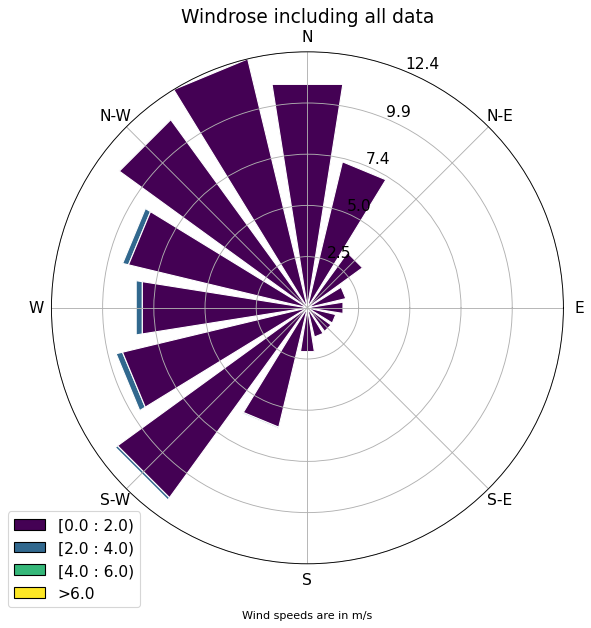

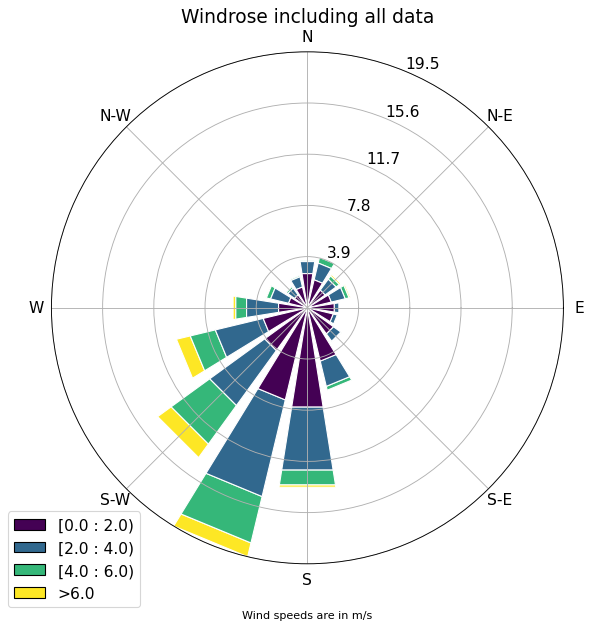

In [86]:
plot_windrose(data_frame=df_voedselbos,output_path="/home/khanalp/code/PhD/fielddataprocessing/plots/ketelbroek/24092024_update/voedselbos/")
plot_windrose(data_frame=df_grasveld,output_path="/home/khanalp/code/PhD/fielddataprocessing/plots/ketelbroek/24092024_update/grasveld/")

/home/khanalp/tmp/ipykernel_2566927/3484416639.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = df_filtered.index
/home/khanalp/tmp/ipykernel_2566927/3484416639.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = pd.to_datetime(df_filtered['time'])


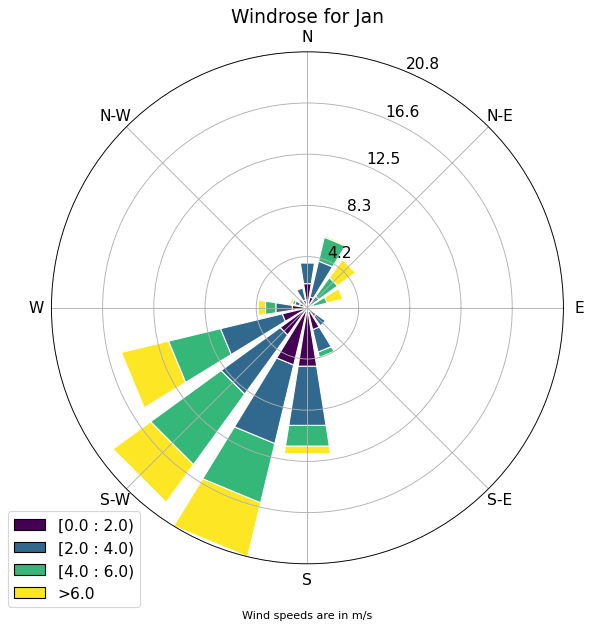

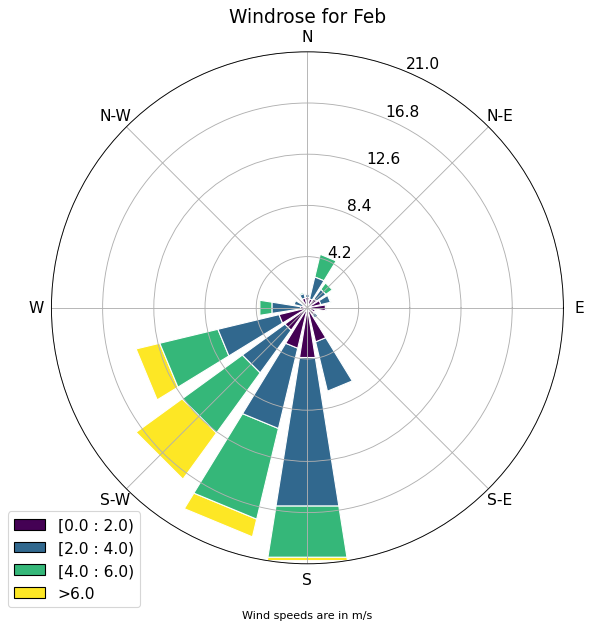

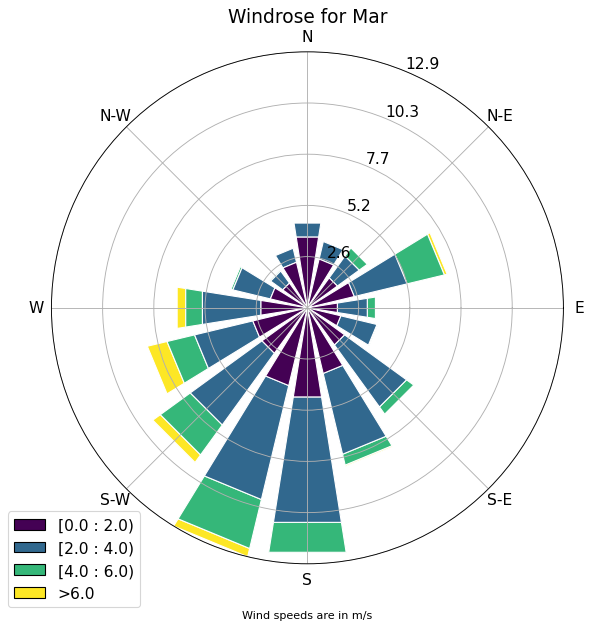

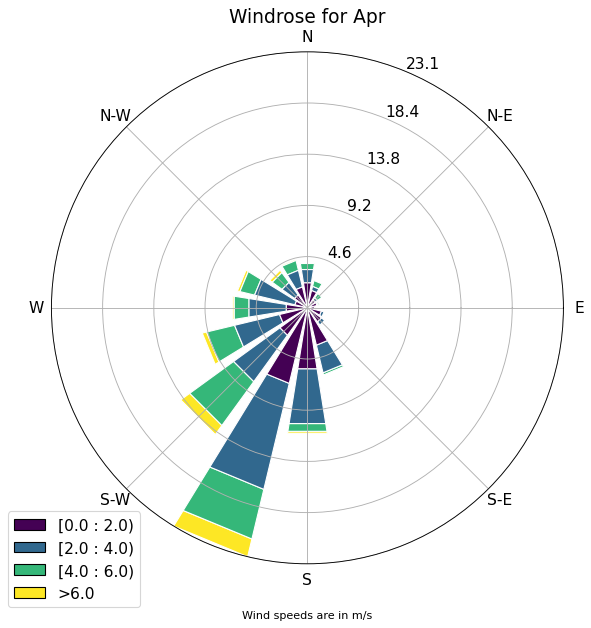

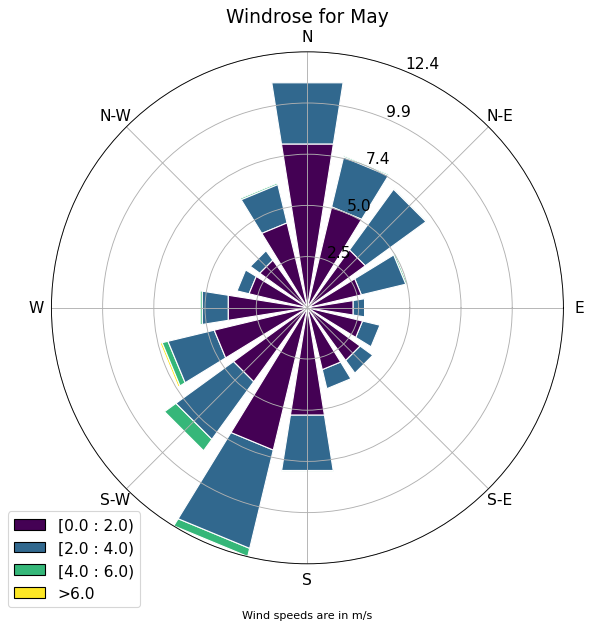

...

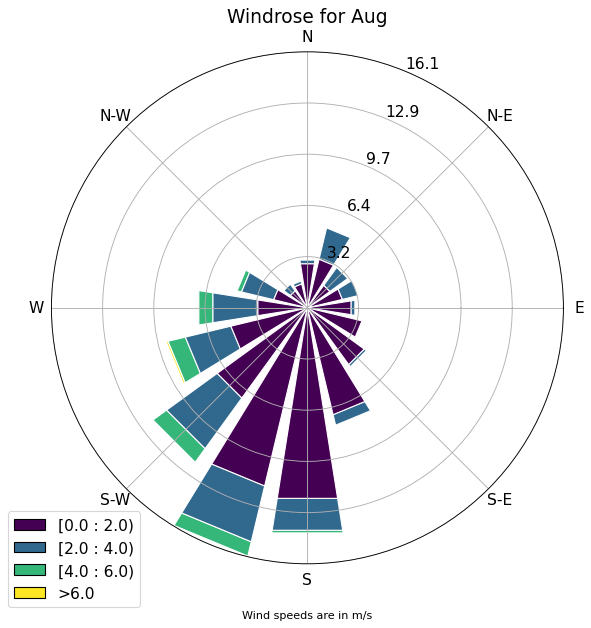

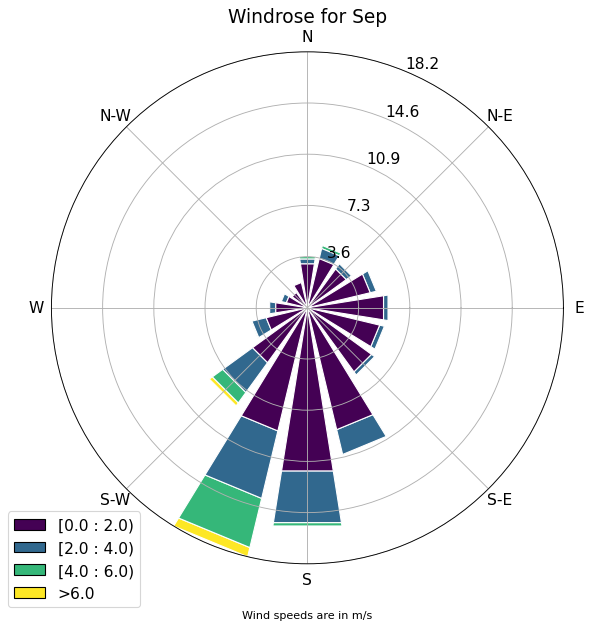

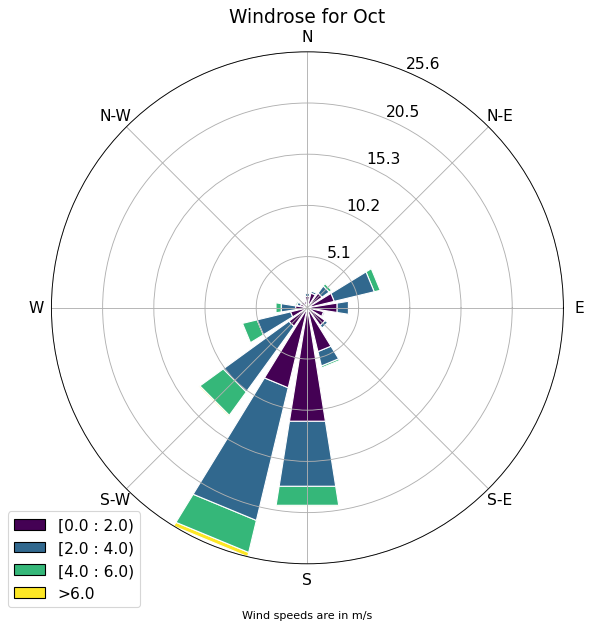

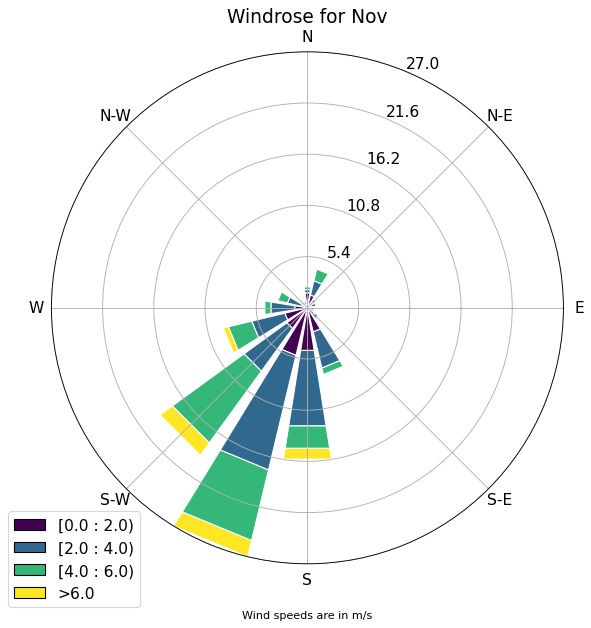

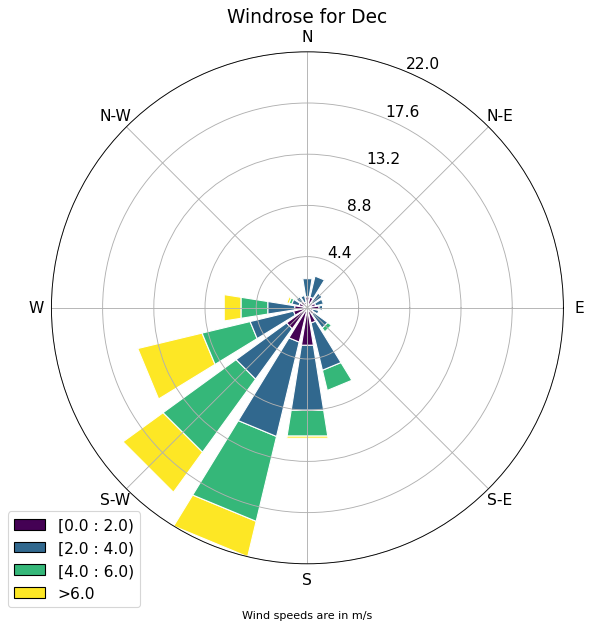

In [87]:
plot_monthly_windrose(data_frame=df_grasveld,output_path="/home/khanalp/code/PhD/fielddataprocessing/plots/ketelbroek/24092024_update/grasveld/")

/home/khanalp/tmp/ipykernel_2566927/3022621315.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = df_filtered.index
/home/khanalp/tmp/ipykernel_2566927/3022621315.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = pd.to_datetime(df_filtered['time'])


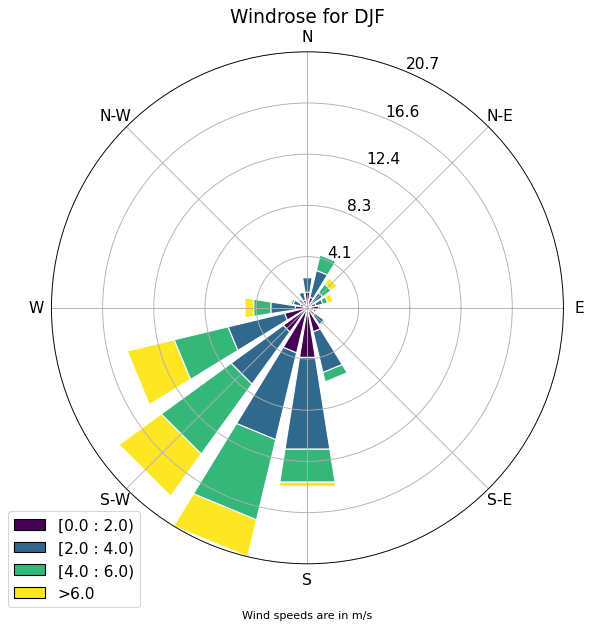

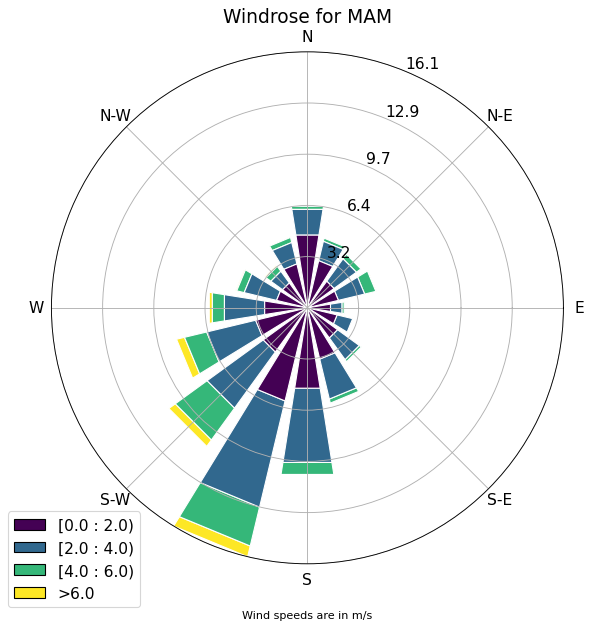

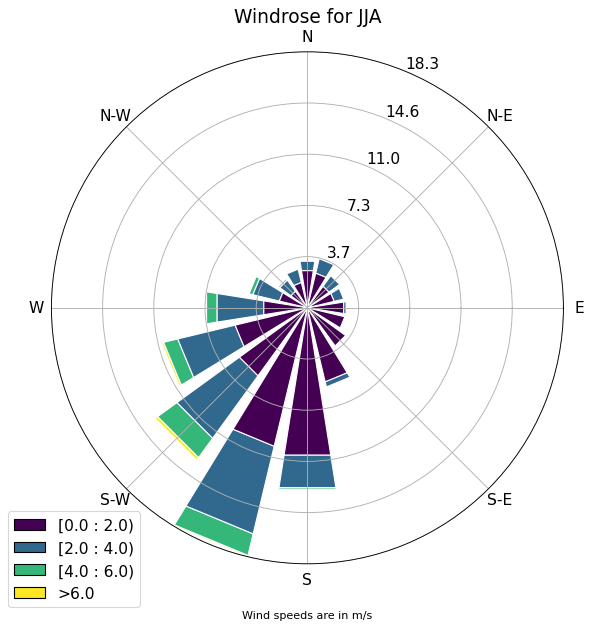

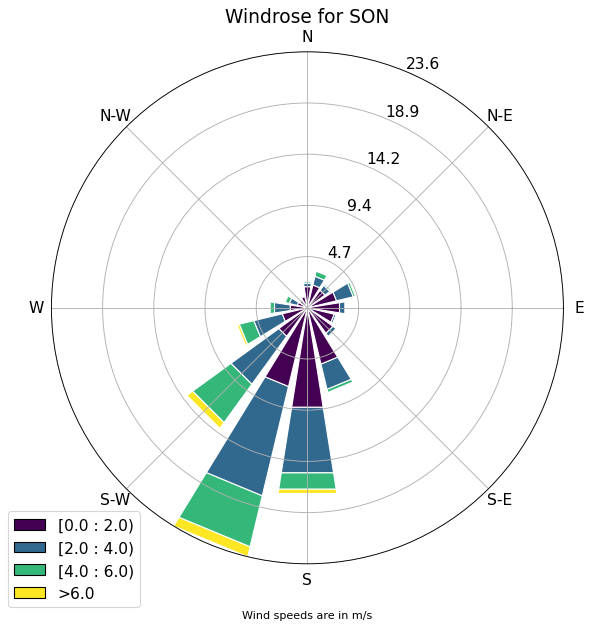

In [88]:
plot_seasonal_windrose(data_frame=df_grasveld,output_path="/home/khanalp/code/PhD/fielddataprocessing/plots/ketelbroek/24092024_update/grasveld/")

/home/khanalp/tmp/ipykernel_2566927/3484416639.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = df_filtered.index
/home/khanalp/tmp/ipykernel_2566927/3484416639.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = pd.to_datetime(df_filtered['time'])


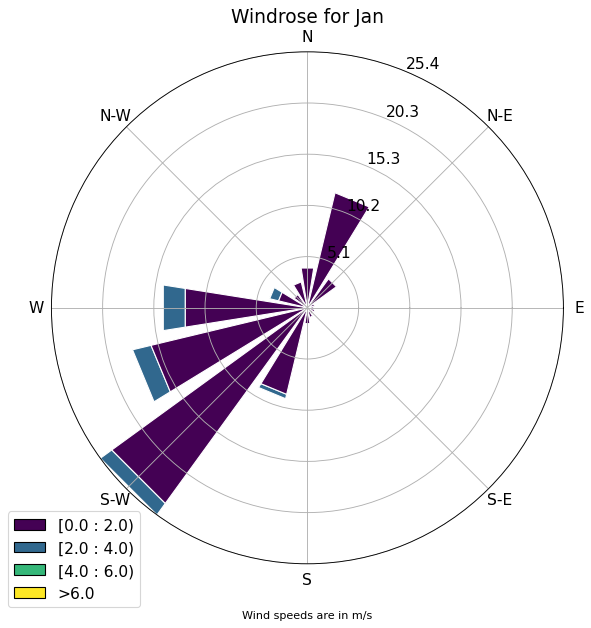

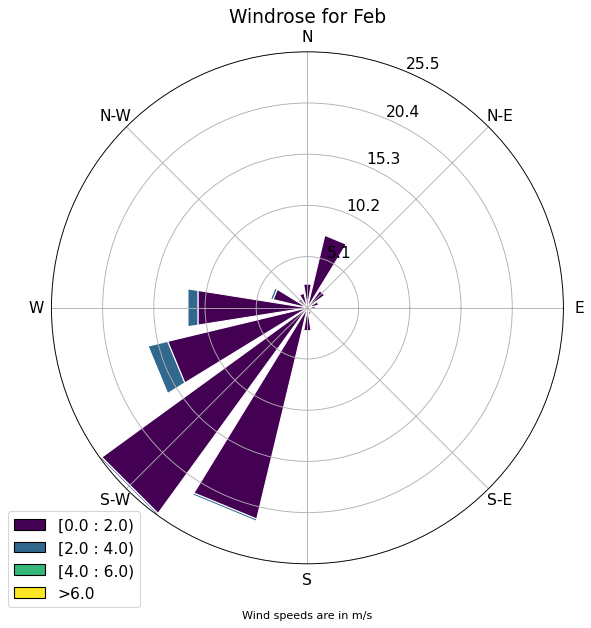

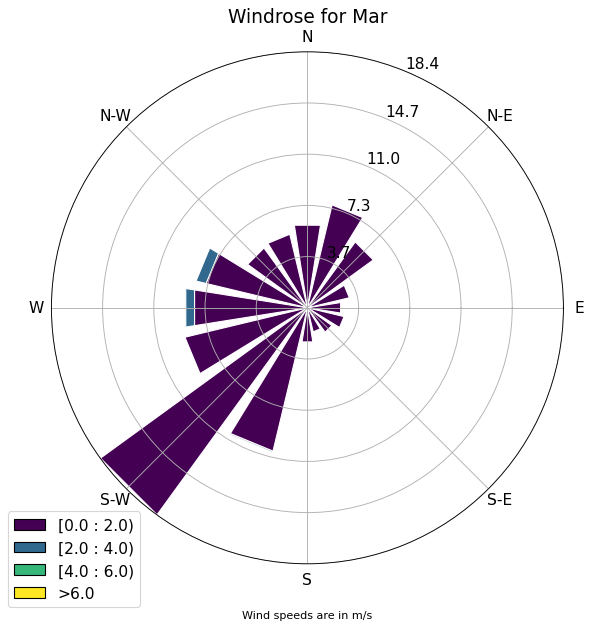

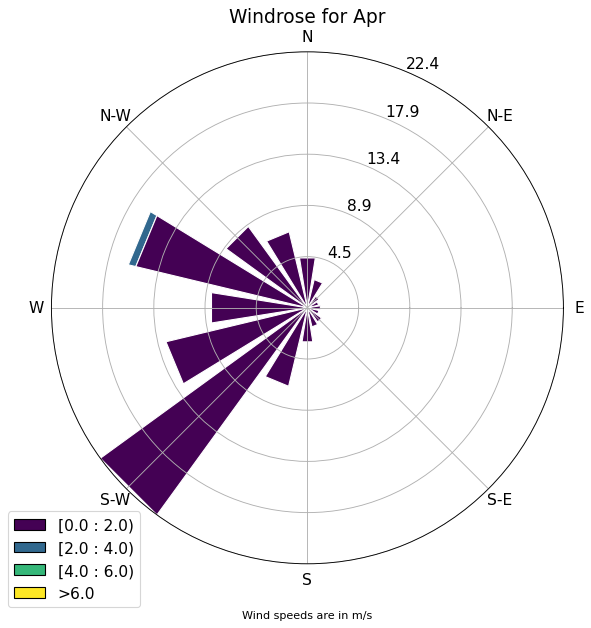

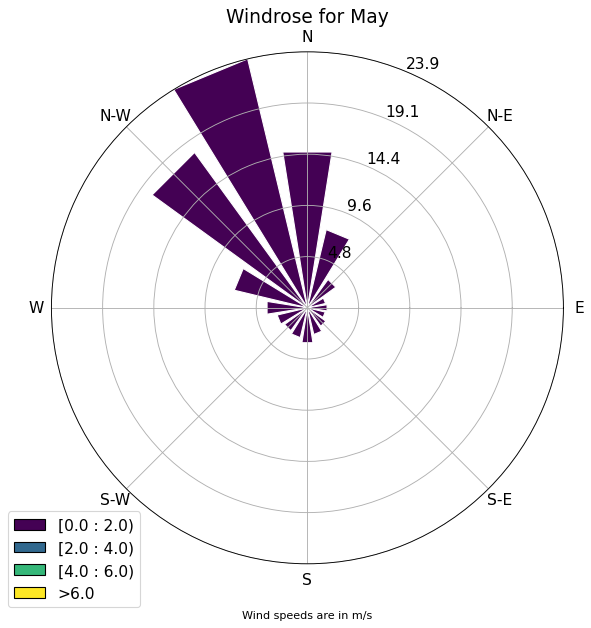

...

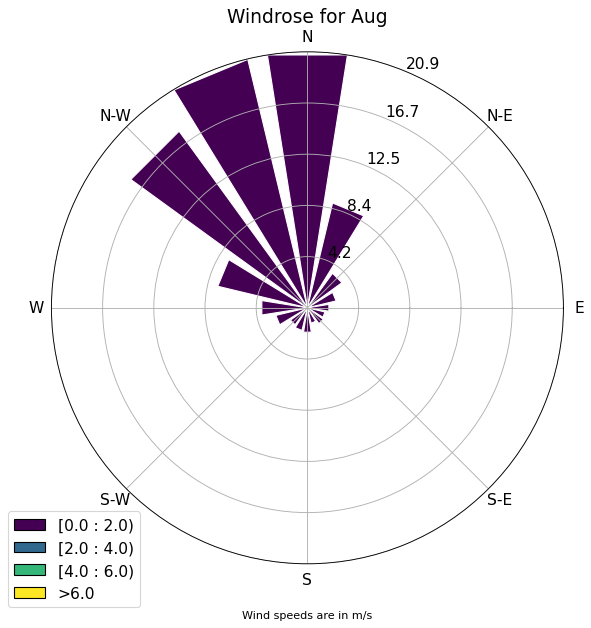

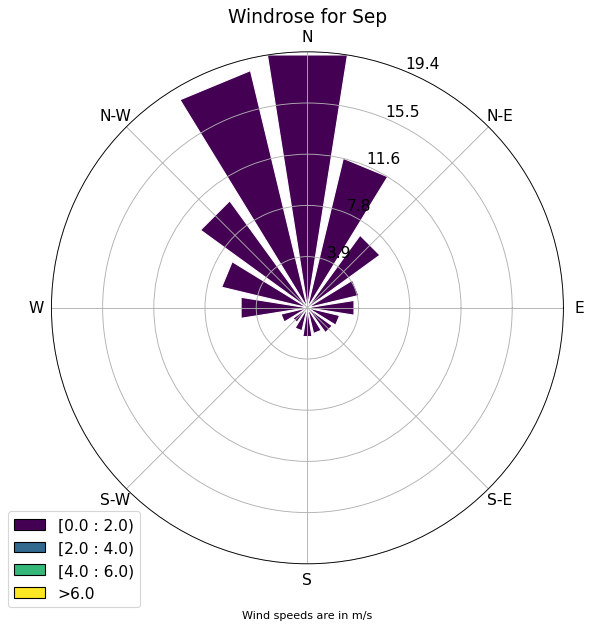

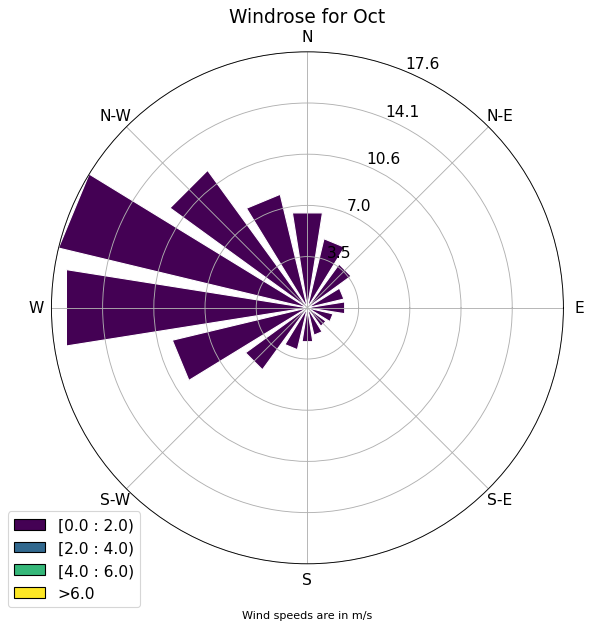

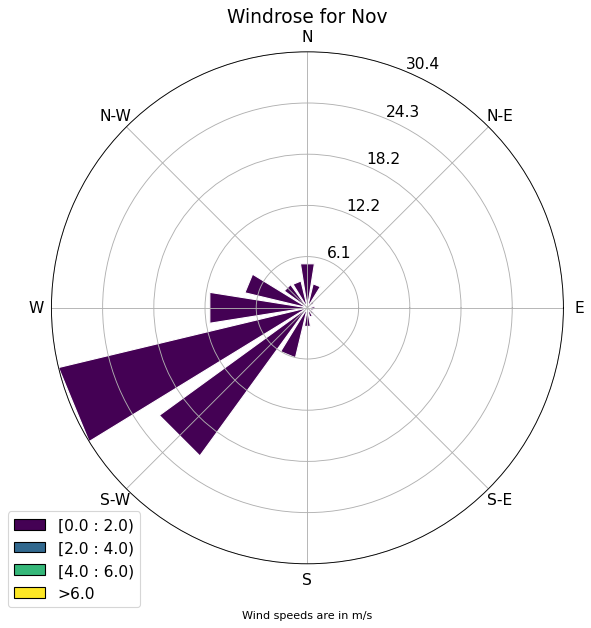

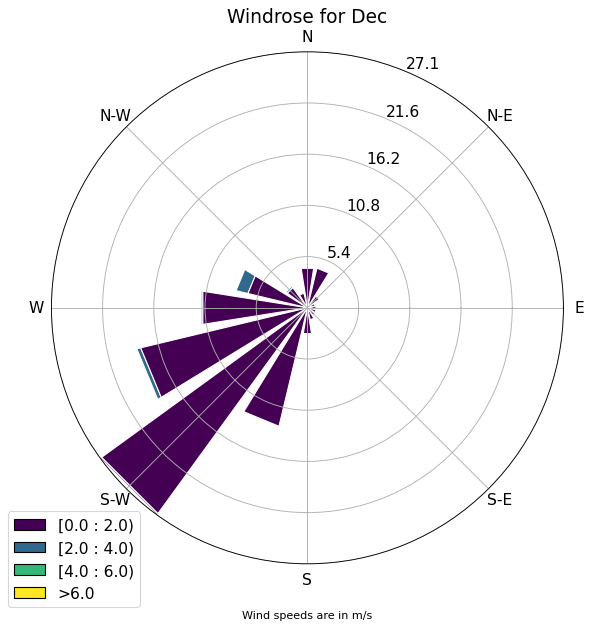

In [89]:
plot_monthly_windrose(data_frame=df_voedselbos,output_path="/home/khanalp/code/PhD/fielddataprocessing/plots/ketelbroek/24092024_update/voedselbos/")

/home/khanalp/tmp/ipykernel_2566927/3022621315.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = df_filtered.index
/home/khanalp/tmp/ipykernel_2566927/3022621315.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['time'] = pd.to_datetime(df_filtered['time'])


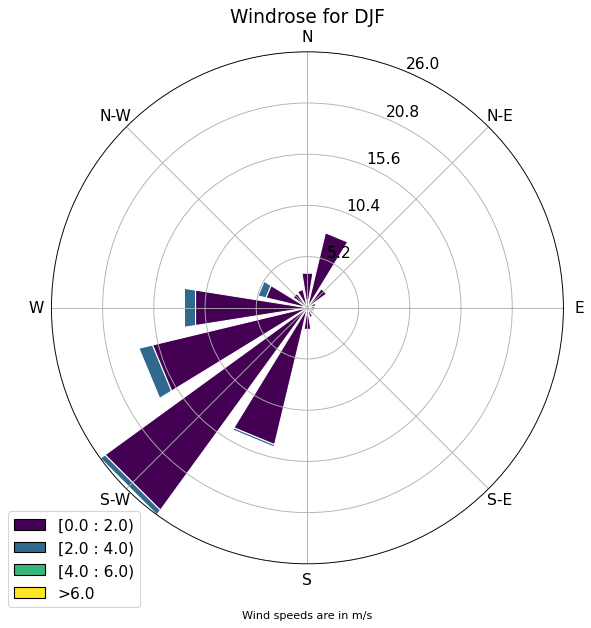

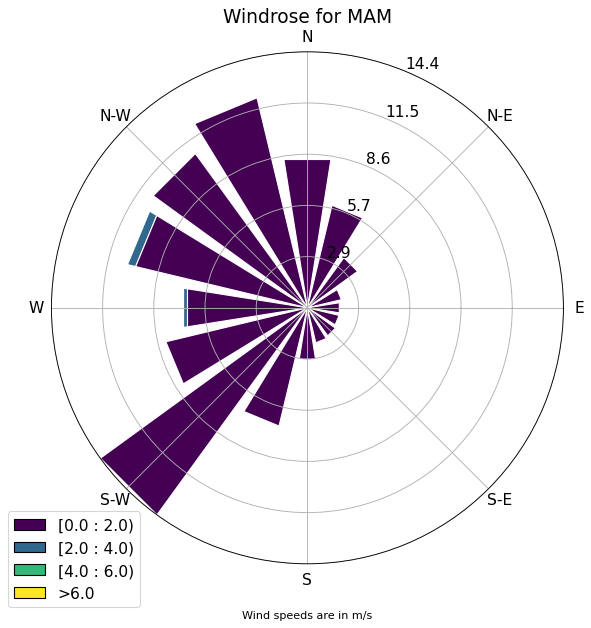

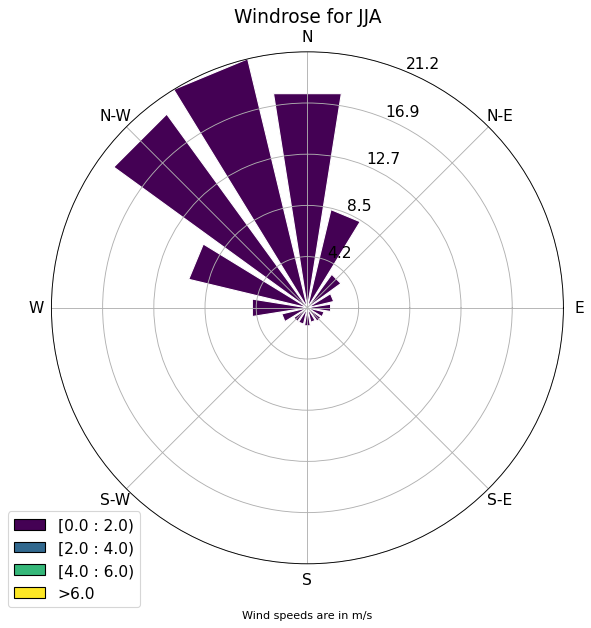

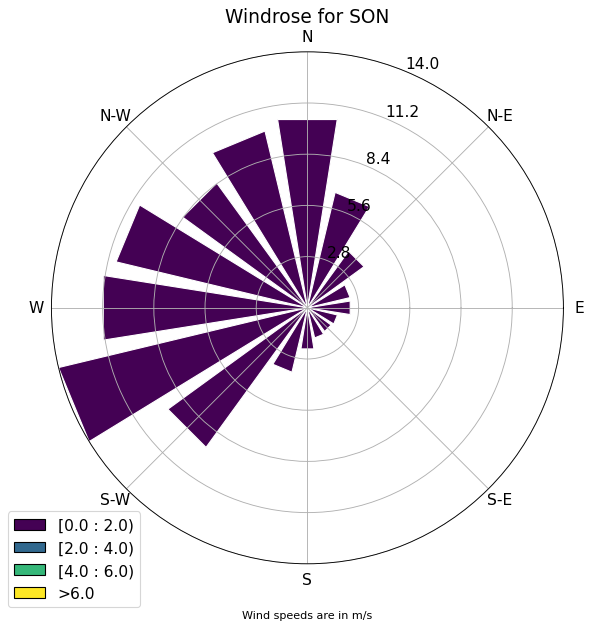

In [90]:
plot_seasonal_windrose(data_frame=df_voedselbos,output_path="/home/khanalp/code/PhD/fielddataprocessing/plots/ketelbroek/24092024_update/voedselbos/")